In [553]:
#Imports
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import requests
from bs4 import BeautifulSoup
from nltk.tokenize import sent_tokenize, word_tokenize, RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.stem.porter import PorterStemmer
from nltk.corpus import stopwords
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, plot_confusion_matrix
# Import CountVectorizer and TFIDFVectorizer from feature_extraction.text.
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics import confusion_matrix, plot_confusion_matrix, accuracy_score, plot_roc_curve, roc_auc_score, recall_score, precision_score, f1_score
import re
%matplotlib inline

Taken from this YouTube video: https://www.youtube.com/watch?v=AcrjEWsMi_E

In [209]:
#Activating Pushshift
url = 'https://api.pushshift.io/reddit/search/submission'

In [210]:
#Creating parameters
params1 = {
    'subreddit': 'Millennials',
    'size': 100
}

In [211]:
#Create requests
proxies = {'https': 'http://127.0.0.1:7769'} #I need on my computer but you might not need on yours
res = requests.get(url, params1, proxies=proxies)

In [212]:
res.status_code

200

In [213]:
#Looking at our data
data = res.json()
data

{'data': [{'all_awardings': [],
   'allow_live_comments': False,
   'author': 'soundsdeep',
   'author_flair_css_class': None,
   'author_flair_richtext': [],
   'author_flair_text': None,
   'author_flair_type': 'text',
   'author_fullname': 't2_667lq',
   'author_is_blocked': False,
   'author_patreon_flair': False,
   'author_premium': False,
   'awarders': [],
   'can_mod_post': False,
   'contest_mode': False,
   'created_utc': 1656251543,
   'crosspost_parent': 't3_vkv5y1',
   'crosspost_parent_list': [{'all_awardings': [],
     'allow_live_comments': False,
     'approved_at_utc': None,
     'approved_by': None,
     'archived': False,
     'author': 'Vibranium2222',
     'author_flair_background_color': None,
     'author_flair_css_class': None,
     'author_flair_richtext': [],
     'author_flair_template_id': None,
     'author_flair_text': None,
     'author_flair_text_color': None,
     'author_flair_type': 'text',
     'author_fullname': 't2_d2kiisbo',
     'author_is_bloc

In [214]:
posts = data['data']
len(posts)

100

We will have to do this 9 more times but with having before parameters to get older dates

In [215]:
params1 = {
    'subreddit': 'Millennials',
    'size': 100,
    'before': 1656181982 #The time that the first params were made
}

In [216]:
#Create requests
proxies = {'https': 'http://127.0.0.1:7769'} #I need on my computer but you might not need on yours
res = requests.get(url, params1, proxies=proxies)

In [217]:
res.status_code

200

In [218]:
#Looking at our data
data = res.json()
data

{'data': [{'all_awardings': [],
   'allow_live_comments': False,
   'author': 'Xiaomeimeilovebus',
   'author_flair_css_class': None,
   'author_flair_richtext': [],
   'author_flair_text': None,
   'author_flair_type': 'text',
   'author_fullname': 't2_luwzuu41',
   'author_is_blocked': False,
   'author_patreon_flair': False,
   'author_premium': False,
   'awarders': [],
   'can_mod_post': False,
   'contest_mode': False,
   'created_utc': 1656178971,
   'domain': 'self.Millennials',
   'full_link': 'https://www.reddit.com/r/Millennials/comments/vkk8vp/letter_to_the_millennials_from_a_gen_z/',
   'gildings': {},
   'id': 'vkk8vp',
   'is_created_from_ads_ui': False,
   'is_crosspostable': False,
   'is_meta': False,
   'is_original_content': False,
   'is_reddit_media_domain': False,
   'is_robot_indexable': False,
   'is_self': True,
   'is_video': False,
   'link_flair_background_color': '#94e044',
   'link_flair_richtext': [],
   'link_flair_template_id': 'ef1da598-7458-11eb-b5f7

In [219]:
len(data['data'])

100

In [220]:
next_batch = data['data']
posts = posts + next_batch
len(posts)

200

In [221]:
params1 = {
    'subreddit': 'Millennials',
    'size': 100,
    'before': 1656178971 #The time that the first params were made
}

In [222]:
#Create requests
proxies = {'https': 'http://127.0.0.1:7769'} #I need on my computer but you might not need on yours
res = requests.get(url, params1, proxies=proxies)

In [223]:
res.status_code

200

In [224]:
#Looking at our data
data = res.json()
data

{'data': [{'all_awardings': [],
   'allow_live_comments': False,
   'author': 'anusgooch',
   'author_flair_css_class': None,
   'author_flair_richtext': [],
   'author_flair_text': None,
   'author_flair_type': 'text',
   'author_fullname': 't2_krzyo4hl',
   'author_is_blocked': False,
   'author_patreon_flair': False,
   'author_premium': False,
   'awarders': [],
   'can_mod_post': False,
   'contest_mode': False,
   'created_utc': 1656159844,
   'domain': 'i.redd.it',
   'full_link': 'https://www.reddit.com/r/Millennials/comments/vkdy4v/i_never_watched_it_but_for_some_reason_it_lives/',
   'gildings': {},
   'id': 'vkdy4v',
   'is_created_from_ads_ui': False,
   'is_crosspostable': True,
   'is_meta': False,
   'is_original_content': False,
   'is_reddit_media_domain': True,
   'is_robot_indexable': True,
   'is_self': False,
   'is_video': False,
   'link_flair_background_color': '#ffd635',
   'link_flair_richtext': [],
   'link_flair_template_id': '097dff14-7459-11eb-8934-0e2c7dd

In [225]:
len(data['data'])

100

In [226]:
next_batch = data['data']
posts = posts + next_batch
len(posts)

300

In [227]:
params1 = {
    'subreddit': 'Millennials',
    'size': 100,
    'before': 1656159844 #The time that the first params were made
}

In [228]:
#Create requests
proxies = {'https': 'http://127.0.0.1:7769'} #I need on my computer but you might not need on yours
res = requests.get(url, params1, proxies=proxies)

In [229]:
res.status_code

200

In [230]:
#Looking at our data
data = res.json()
data

{'data': [{'all_awardings': [],
   'allow_live_comments': False,
   'author': 'Zen-bunny',
   'author_flair_css_class': None,
   'author_flair_richtext': [],
   'author_flair_text': None,
   'author_flair_type': 'text',
   'author_fullname': 't2_6psjlxqf',
   'author_is_blocked': False,
   'author_patreon_flair': False,
   'author_premium': False,
   'awarders': [],
   'can_mod_post': False,
   'contest_mode': False,
   'created_utc': 1656147300,
   'domain': 'i.redd.it',
   'full_link': 'https://www.reddit.com/r/Millennials/comments/vkauao/for_the_older_millennials/',
   'gildings': {},
   'id': 'vkauao',
   'is_created_from_ads_ui': False,
   'is_crosspostable': True,
   'is_meta': False,
   'is_original_content': False,
   'is_reddit_media_domain': True,
   'is_robot_indexable': True,
   'is_self': False,
   'is_video': False,
   'link_flair_background_color': '#ff66ac',
   'link_flair_richtext': [],
   'link_flair_template_id': 'fb50b602-7458-11eb-a8d5-0e2da629ed17',
   'link_flair

In [231]:
len(data['data'])

100

In [232]:
next_batch = data['data']
posts = posts + next_batch
len(posts)

400

In [233]:
params1 = {
    'subreddit': 'Millennials',
    'size': 100,
    'before': 1656147300 #The time that the first params were made
}

In [234]:
#Create requests
proxies = {'https': 'http://127.0.0.1:7769'} #I need on my computer but you might not need on yours
res = requests.get(url, params1, proxies=proxies)

In [235]:
res.status_code

200

In [236]:
#Looking at our data
data = res.json()
data

{'data': [{'all_awardings': [],
   'allow_live_comments': False,
   'author': 'BipolarPunk91',
   'author_flair_css_class': None,
   'author_flair_richtext': [],
   'author_flair_text': None,
   'author_flair_type': 'text',
   'author_fullname': 't2_isiwum38',
   'author_is_blocked': False,
   'author_patreon_flair': False,
   'author_premium': False,
   'awarders': [],
   'can_mod_post': False,
   'contest_mode': False,
   'created_utc': 1656146547,
   'domain': 'self.Millennials',
   'full_link': 'https://www.reddit.com/r/Millennials/comments/vkao4w/understanding_millennials_and_attention_span/',
   'gildings': {},
   'id': 'vkao4w',
   'is_created_from_ads_ui': False,
   'is_crosspostable': True,
   'is_meta': False,
   'is_original_content': False,
   'is_reddit_media_domain': False,
   'is_robot_indexable': True,
   'is_self': True,
   'is_video': False,
   'link_flair_background_color': '#7193ff',
   'link_flair_richtext': [],
   'link_flair_template_id': '020d9fd2-7459-11eb-b3c6

In [237]:
len(data['data'])

100

In [238]:
next_batch = data['data']
posts = posts + next_batch
len(posts)

500

In [239]:
params1 = {
    'subreddit': 'Millennials',
    'size': 100,
    'before': 1656146547 #The time that the first params were made
}

In [240]:
#Create requests
proxies = {'https': 'http://127.0.0.1:7769'} #I need on my computer but you might not need on yours
res = requests.get(url, params1, proxies=proxies)

In [241]:
res.status_code

200

In [242]:
#Looking at our data
data = res.json()
data

{'data': [{'all_awardings': [],
   'allow_live_comments': False,
   'author': 'J7W2_Shindenkai',
   'author_flair_css_class': None,
   'author_flair_richtext': [],
   'author_flair_text': None,
   'author_flair_type': 'text',
   'author_fullname': 't2_mn133aua',
   'author_is_blocked': False,
   'author_patreon_flair': False,
   'author_premium': False,
   'awarders': [],
   'can_mod_post': False,
   'contest_mode': False,
   'created_utc': 1656129845,
   'domain': 'i.redd.it',
   'full_link': 'https://www.reddit.com/r/Millennials/comments/vk6f8l/is_this_2013_magazine_cover_cringe_or_what/',
   'gildings': {},
   'id': 'vk6f8l',
   'is_created_from_ads_ui': False,
   'is_crosspostable': True,
   'is_meta': False,
   'is_original_content': False,
   'is_reddit_media_domain': True,
   'is_robot_indexable': True,
   'is_self': False,
   'is_video': False,
   'link_flair_background_color': '#ffd635',
   'link_flair_richtext': [],
   'link_flair_template_id': '097dff14-7459-11eb-8934-0e2c7d

In [243]:
len(data['data'])

100

In [244]:
next_batch = data['data']
posts = posts + next_batch
len(posts)

600

In [245]:
params1 = {
    'subreddit': 'Millennials',
    'size': 100,
    'before': 1656129845 #The time that the first params were made
}

In [246]:
#Create requests
proxies = {'https': 'http://127.0.0.1:7769'} #I need on my computer but you might not need on yours
res = requests.get(url, params1, proxies=proxies)

In [247]:
res.status_code

200

In [248]:
#Looking at our data
data = res.json()
data

{'data': [{'all_awardings': [],
   'allow_live_comments': False,
   'author': 'WaterRevolutionary72',
   'author_flair_css_class': None,
   'author_flair_richtext': [],
   'author_flair_text': None,
   'author_flair_type': 'text',
   'author_fullname': 't2_4focahhs',
   'author_is_blocked': False,
   'author_patreon_flair': False,
   'author_premium': False,
   'awarders': [],
   'can_mod_post': False,
   'contest_mode': False,
   'created_utc': 1656126673,
   'domain': 'self.Millennials',
   'full_link': 'https://www.reddit.com/r/Millennials/comments/vk5i52/mods_making_me_work_hard_on_this_one/',
   'gildings': {},
   'id': 'vk5i52',
   'is_created_from_ads_ui': False,
   'is_crosspostable': True,
   'is_meta': False,
   'is_original_content': False,
   'is_reddit_media_domain': False,
   'is_robot_indexable': True,
   'is_self': True,
   'is_video': False,
   'link_flair_background_color': '#94e044',
   'link_flair_richtext': [],
   'link_flair_template_id': 'ef1da598-7458-11eb-b5f7-

In [249]:
len(data['data'])

100

In [250]:
next_batch = data['data']
posts = posts + next_batch
len(posts)

700

In [251]:
params1 = {
    'subreddit': 'Millennials',
    'size': 100,
    'before': 1656126673 #The time that the first params were made
}

In [252]:
#Create requests
proxies = {'https': 'http://127.0.0.1:7769'} #I need on my computer but you might not need on yours
res = requests.get(url, params1, proxies=proxies)

In [253]:
res.status_code

200

In [254]:
#Looking at our data
data = res.json()
data

{'data': [{'all_awardings': [],
   'allow_live_comments': False,
   'author': '_togepi91_',
   'author_flair_background_color': '#f7accf',
   'author_flair_css_class': 'millennial',
   'author_flair_richtext': [],
   'author_flair_template_id': '65c72e52-ea27-11e9-a5e5-0e427099dabc',
   'author_flair_text': '1991',
   'author_flair_text_color': 'light',
   'author_flair_type': 'text',
   'author_fullname': 't2_orn0ngh8',
   'author_is_blocked': False,
   'author_patreon_flair': False,
   'author_premium': False,
   'awarders': [],
   'can_mod_post': False,
   'contest_mode': False,
   'created_utc': 1656125024,
   'domain': 'i.redd.it',
   'full_link': 'https://www.reddit.com/r/Millennials/comments/vk50z5/just_curious_but_who_had_an_crush_on_him_during/',
   'gildings': {},
   'id': 'vk50z5',
   'is_created_from_ads_ui': False,
   'is_crosspostable': True,
   'is_meta': False,
   'is_original_content': False,
   'is_reddit_media_domain': True,
   'is_robot_indexable': True,
   'is_self

In [255]:
len(data['data'])

100

In [256]:
next_batch = data['data']
posts = posts + next_batch
len(posts)

800

In [257]:
params1 = {
    'subreddit': 'Millennials',
    'size': 100,
    'before': 1656125024 #The time that the first params were made
}

In [258]:
#Create requests
proxies = {'https': 'http://127.0.0.1:7769'} #I need on my computer but you might not need on yours
res = requests.get(url, params1, proxies=proxies)

In [259]:
res.status_code

200

In [260]:
#Looking at our data
data = res.json()
data

{'data': [{'all_awardings': [],
   'allow_live_comments': False,
   'author': 'stephen_strange_1990',
   'author_flair_background_color': '#f7accf',
   'author_flair_css_class': 'millennial',
   'author_flair_richtext': [],
   'author_flair_template_id': '65c72e52-ea27-11e9-a5e5-0e427099dabc',
   'author_flair_text': '1990',
   'author_flair_text_color': 'light',
   'author_flair_type': 'text',
   'author_fullname': 't2_mzi41mwi',
   'author_is_blocked': False,
   'author_patreon_flair': False,
   'author_premium': False,
   'awarders': [],
   'can_mod_post': False,
   'contest_mode': False,
   'created_utc': 1656121897,
   'domain': 'self.Millennials',
   'full_link': 'https://www.reddit.com/r/Millennials/comments/vk43df/are_we_agreed/',
   'gildings': {},
   'id': 'vk43df',
   'is_created_from_ads_ui': False,
   'is_crosspostable': False,
   'is_meta': False,
   'is_original_content': False,
   'is_reddit_media_domain': False,
   'is_robot_indexable': False,
   'is_self': True,
   'i

In [261]:
len(data['data'])

100

In [262]:
next_batch = data['data']
posts = posts + next_batch
len(posts)

900

In [263]:
params1 = {
    'subreddit': 'Millennials',
    'size': 100,
    'before': 1656121897 #The time that the first params were made
}

In [264]:
#Create requests
proxies = {'https': 'http://127.0.0.1:7769'} #I need on my computer but you might not need on yours
res = requests.get(url, params1, proxies=proxies)

In [265]:
res.status_code

200

In [266]:
#Looking at our data
data = res.json()
data

{'data': [{'all_awardings': [],
   'allow_live_comments': False,
   'author': 'ForRedditFun',
   'author_flair_background_color': '#f7accf',
   'author_flair_css_class': 'millennial',
   'author_flair_richtext': [],
   'author_flair_template_id': '65c72e52-ea27-11e9-a5e5-0e427099dabc',
   'author_flair_text': '1993 ',
   'author_flair_text_color': 'light',
   'author_flair_type': 'text',
   'author_fullname': 't2_o1y9y',
   'author_is_blocked': False,
   'author_patreon_flair': False,
   'author_premium': False,
   'awarders': [],
   'can_mod_post': False,
   'contest_mode': False,
   'created_utc': 1656119949,
   'crosspost_parent': 't3_vjrl5j',
   'crosspost_parent_list': [{'all_awardings': [{'award_sub_type': 'GLOBAL',
       'award_type': 'global',
       'awardings_required_to_grant_benefits': None,
       'coin_price': 150,
       'coin_reward': 0,
       'count': 1,
       'days_of_drip_extension': None,
       'days_of_premium': None,
       'description': 'Thank you stranger. 

In [267]:
len(data['data'])

100

In [268]:
next_batch = data['data']
posts = posts + next_batch
len(posts)

1000

In [269]:
#create Dataframe for millennials
#millennials = pd.DataFrame(posts)

In [270]:
#millennials.head()

In [271]:
#millennials[['subreddit', 'selftext', 'title']].head()

Now we will do the same for Gen Z subreddit

In [272]:
#Creating parameters
params1 = {
    'subreddit': 'GenZ',
    'size': 100
}

In [273]:
#Create requests
proxies = {'https': 'http://127.0.0.1:7769'} #I need on my computer but you might not need on yours
res = requests.get(url, params1, proxies=proxies)

In [274]:
res.status_code

200

In [275]:
#Looking at our data
data = res.json()
data

{'data': [{'all_awardings': [],
   'allow_live_comments': False,
   'author': 'Perfectooooo',
   'author_flair_css_class': None,
   'author_flair_richtext': [],
   'author_flair_text': None,
   'author_flair_type': 'text',
   'author_fullname': 't2_mk8mkwml',
   'author_is_blocked': False,
   'author_patreon_flair': False,
   'author_premium': False,
   'awarders': [],
   'can_mod_post': False,
   'contest_mode': False,
   'created_utc': 1656253396,
   'domain': 'self.GenZ',
   'full_link': 'https://www.reddit.com/r/GenZ/comments/vl5t3p/when_were_you_born_and_what_part_of_the_decade_do/',
   'gildings': {},
   'id': 'vl5t3p',
   'is_created_from_ads_ui': False,
   'is_crosspostable': False,
   'is_meta': False,
   'is_original_content': False,
   'is_reddit_media_domain': False,
   'is_robot_indexable': False,
   'is_self': True,
   'is_video': False,
   'link_flair_background_color': '#738491',
   'link_flair_css_class': 'discussion',
   'link_flair_richtext': [],
   'link_flair_templ

In [276]:
next_batch = data['data']
posts = posts + next_batch
len(posts)

1100

In [277]:
params1 = {
    'subreddit': 'GenZ',
    'size': 100,
    'before': 1656180888 #The time that the first params were made
}

In [278]:
#Create requests
proxies = {'https': 'http://127.0.0.1:7769'} #I need on my computer but you might not need on yours
res = requests.get(url, params1, proxies=proxies)

In [279]:
res.status_code

200

In [280]:
#Looking at our data
data = res.json()
data

{'data': [{'all_awardings': [],
   'allow_live_comments': False,
   'author': 'Alchemy92',
   'author_flair_css_class': None,
   'author_flair_richtext': [],
   'author_flair_text': None,
   'author_flair_type': 'text',
   'author_fullname': 't2_mbxali5u',
   'author_is_blocked': False,
   'author_patreon_flair': False,
   'author_premium': False,
   'awarders': [],
   'can_mod_post': False,
   'contest_mode': False,
   'created_utc': 1656177688,
   'domain': 'self.GenZ',
   'full_link': 'https://www.reddit.com/r/GenZ/comments/vkjsz2/have_you_ever_wish_you_were_born_before_your/',
   'gildings': {},
   'id': 'vkjsz2',
   'is_created_from_ads_ui': False,
   'is_crosspostable': False,
   'is_meta': False,
   'is_original_content': False,
   'is_reddit_media_domain': False,
   'is_robot_indexable': False,
   'is_self': True,
   'is_video': False,
   'link_flair_background_color': '#738491',
   'link_flair_css_class': 'discussion',
   'link_flair_richtext': [],
   'link_flair_template_id':

In [281]:
next_batch = data['data']
posts = posts + next_batch
len(posts)

1200

In [282]:
params1 = {
    'subreddit': 'GenZ',
    'size': 100,
    'before': 1656177688 #The time that the first params were made
}

In [283]:
#Create requests
proxies = {'https': 'http://127.0.0.1:7769'} #I need on my computer but you might not need on yours
res = requests.get(url, params1, proxies=proxies)

In [284]:
res.status_code

200

In [285]:
#Looking at our data
data = res.json()
data

{'data': [{'all_awardings': [],
   'allow_live_comments': False,
   'author': 'Gamesmarter9139',
   'author_flair_css_class': None,
   'author_flair_richtext': [],
   'author_flair_text': None,
   'author_flair_type': 'text',
   'author_fullname': 't2_91a3uo6u',
   'author_is_blocked': False,
   'author_patreon_flair': False,
   'author_premium': False,
   'awarders': [],
   'can_mod_post': False,
   'contest_mode': False,
   'created_utc': 1656176524,
   'domain': 'youtu.be',
   'full_link': 'https://www.reddit.com/r/GenZ/comments/vkjeqa/does_kers_work_on_a_electric_scooter/',
   'gildings': {},
   'id': 'vkjeqa',
   'is_created_from_ads_ui': False,
   'is_crosspostable': False,
   'is_meta': False,
   'is_original_content': False,
   'is_reddit_media_domain': False,
   'is_robot_indexable': False,
   'is_self': False,
   'is_video': False,
   'link_flair_background_color': '#738491',
   'link_flair_css_class': 'other',
   'link_flair_richtext': [],
   'link_flair_template_id': '77add

In [286]:
next_batch = data['data']
posts = posts + next_batch
len(posts)

1300

In [287]:
params1 = {
    'subreddit': 'GenZ',
    'size': 100,
    'before': 1656176524 #The time that the first params were made
}

In [288]:
#Create requests
proxies = {'https': 'http://127.0.0.1:7769'} #I need on my computer but you might not need on yours
res = requests.get(url, params1, proxies=proxies)

In [289]:
res.status_code

200

In [290]:
#Looking at our data
data = res.json()
data

{'data': [{'all_awardings': [],
   'allow_live_comments': False,
   'author': 'Gamesmarter9139',
   'author_flair_css_class': None,
   'author_flair_richtext': [],
   'author_flair_text': None,
   'author_flair_type': 'text',
   'author_fullname': 't2_91a3uo6u',
   'author_is_blocked': False,
   'author_patreon_flair': False,
   'author_premium': False,
   'awarders': [],
   'can_mod_post': False,
   'contest_mode': False,
   'created_utc': 1656176374,
   'domain': 'reddit.com',
   'full_link': 'https://www.reddit.com/r/GenZ/comments/vkjcjd/does_kers_work_on_the_xiaomi_mi_pro_2/',
   'gildings': {},
   'id': 'vkjcjd',
   'is_created_from_ads_ui': False,
   'is_crosspostable': False,
   'is_meta': False,
   'is_original_content': False,
   'is_reddit_media_domain': False,
   'is_robot_indexable': False,
   'is_self': False,
   'is_video': False,
   'link_flair_background_color': '#738491',
   'link_flair_css_class': 'other',
   'link_flair_richtext': [],
   'link_flair_template_id': '77

In [291]:
next_batch = data['data']
posts = posts + next_batch
len(posts)

1400

In [292]:
params1 = {
    'subreddit': 'GenZ',
    'size': 100,
    'before': 1656176374 #The time that the first params were made
}

In [293]:
#Create requests
proxies = {'https': 'http://127.0.0.1:7769'} #I need on my computer but you might not need on yours
res = requests.get(url, params1, proxies=proxies)

In [294]:
res.status_code

200

In [295]:
#Looking at our data
data = res.json()
data

{'data': [{'all_awardings': [],
   'allow_live_comments': False,
   'author': 'Flunkiebubs',
   'author_flair_css_class': None,
   'author_flair_richtext': [],
   'author_flair_template_id': '1a3e6944-5f7e-11e8-968c-0e4395560a44',
   'author_flair_text': '2002',
   'author_flair_text_color': 'dark',
   'author_flair_type': 'text',
   'author_fullname': 't2_diph6l9c',
   'author_is_blocked': False,
   'author_patreon_flair': False,
   'author_premium': False,
   'awarders': [],
   'can_mod_post': False,
   'contest_mode': False,
   'created_utc': 1656175322,
   'domain': 'i.redd.it',
   'full_link': 'https://www.reddit.com/r/GenZ/comments/vkiz7d/people_always_talk_about_the_fnaf_undertale_fan/',
   'gildings': {},
   'id': 'vkiz7d',
   'is_created_from_ads_ui': False,
   'is_crosspostable': True,
   'is_meta': False,
   'is_original_content': False,
   'is_reddit_media_domain': True,
   'is_robot_indexable': True,
   'is_self': False,
   'is_video': False,
   'link_flair_background_colo

In [296]:
next_batch = data['data']
posts = posts + next_batch
len(posts)

1500

In [297]:
params1 = {
    'subreddit': 'GenZ',
    'size': 100,
    'before': 1656175322 #The time that the first params were made
}

In [298]:
#Create requests
proxies = {'https': 'http://127.0.0.1:7769'} #I need on my computer but you might not need on yours
res = requests.get(url, params1, proxies=proxies)

In [299]:
res.status_code

200

In [300]:
#Looking at our data
data = res.json()
data

{'data': [{'all_awardings': [],
   'allow_live_comments': False,
   'author': 'Aegidius25',
   'author_flair_css_class': None,
   'author_flair_richtext': [],
   'author_flair_text': None,
   'author_flair_type': 'text',
   'author_fullname': 't2_ycpdtxh',
   'author_is_blocked': False,
   'author_patreon_flair': False,
   'author_premium': False,
   'awarders': [],
   'can_mod_post': False,
   'contest_mode': False,
   'created_utc': 1656173850,
   'domain': 'self.GenZ',
   'full_link': 'https://www.reddit.com/r/GenZ/comments/vkigr2/us_hit_with_nationwide_creditdebit_card_outage/',
   'gildings': {},
   'id': 'vkigr2',
   'is_created_from_ads_ui': False,
   'is_crosspostable': True,
   'is_meta': False,
   'is_original_content': False,
   'is_reddit_media_domain': False,
   'is_robot_indexable': True,
   'is_self': True,
   'is_video': False,
   'link_flair_background_color': '#738491',
   'link_flair_css_class': 'discussion',
   'link_flair_richtext': [],
   'link_flair_template_id':

In [301]:
next_batch = data['data']
posts = posts + next_batch
len(posts)

1600

In [302]:
params1 = {
    'subreddit': 'GenZ',
    'size': 100,
    'before': 1656173850 #The time that the first params were made
}

In [303]:
#Create requests
proxies = {'https': 'http://127.0.0.1:7769'} #I need on my computer but you might not need on yours
res = requests.get(url, params1, proxies=proxies)

In [304]:
res.status_code

200

In [305]:
#Looking at our data
data = res.json()
data

{'data': [{'all_awardings': [],
   'allow_live_comments': False,
   'author': 'Jndst21',
   'author_flair_css_class': None,
   'author_flair_richtext': [],
   'author_flair_template_id': '0acba22e-5f7e-11e8-8f8f-0e55d9873ae6',
   'author_flair_text': '1998',
   'author_flair_text_color': 'dark',
   'author_flair_type': 'text',
   'author_fullname': 't2_2ykhjjgh',
   'author_is_blocked': False,
   'author_patreon_flair': False,
   'author_premium': False,
   'awarders': [],
   'can_mod_post': False,
   'contest_mode': False,
   'created_utc': 1656173117,
   'domain': 'i.redd.it',
   'full_link': 'https://www.reddit.com/r/GenZ/comments/vki7ly/crazy_that_these_two_are_turning_18_years_old/',
   'gildings': {},
   'id': 'vki7ly',
   'is_created_from_ads_ui': False,
   'is_crosspostable': True,
   'is_meta': False,
   'is_original_content': False,
   'is_reddit_media_domain': True,
   'is_robot_indexable': True,
   'is_self': False,
   'is_video': False,
   'link_flair_background_color': '#

In [306]:
next_batch = data['data']
posts = posts + next_batch
len(posts)

1700

In [307]:
params1 = {
    'subreddit': 'GenZ',
    'size': 100,
    'before': 1656173117 #The time that the first params were made
}

In [308]:
#Create requests
proxies = {'https': 'http://127.0.0.1:7769'} #I need on my computer but you might not need on yours
res = requests.get(url, params1, proxies=proxies)

In [309]:
res.status_code

200

In [310]:
#Looking at our data
data = res.json()
data

{'data': [{'all_awardings': [],
   'allow_live_comments': False,
   'author': 'WhoDatFreshBoi',
   'author_flair_css_class': None,
   'author_flair_richtext': [],
   'author_flair_template_id': '26699946-5f7e-11e8-a098-0e3d7eaad1b8',
   'author_flair_text': '2004',
   'author_flair_text_color': 'dark',
   'author_flair_type': 'text',
   'author_fullname': 't2_25fhvjyi',
   'author_is_blocked': False,
   'author_patreon_flair': False,
   'author_premium': False,
   'awarders': [],
   'can_mod_post': False,
   'contest_mode': False,
   'created_utc': 1656167852,
   'domain': 'i.redd.it',
   'full_link': 'https://www.reddit.com/r/GenZ/comments/vkge7r/boomers_dont_get_an_asdf_reference_meanwhile_i/',
   'gildings': {},
   'id': 'vkge7r',
   'is_created_from_ads_ui': False,
   'is_crosspostable': True,
   'is_meta': False,
   'is_original_content': False,
   'is_reddit_media_domain': True,
   'is_robot_indexable': True,
   'is_self': False,
   'is_video': False,
   'link_flair_background_co

In [311]:
next_batch = data['data']
posts = posts + next_batch
len(posts)

1800

In [312]:
params1 = {
    'subreddit': 'GenZ',
    'size': 100,
    'before': 1656167852 #The time that the first params were made
}

In [313]:
#Create requests
proxies = {'https': 'http://127.0.0.1:7769'} #I need on my computer but you might not need on yours
res = requests.get(url, params1, proxies=proxies)

In [314]:
res.status_code

200

In [315]:
#Looking at our data
data = res.json()
data

{'data': [{'all_awardings': [],
   'allow_live_comments': False,
   'author': 'WhoDatFreshBoi',
   'author_flair_css_class': None,
   'author_flair_richtext': [],
   'author_flair_template_id': '26699946-5f7e-11e8-a098-0e3d7eaad1b8',
   'author_flair_text': '2004',
   'author_flair_text_color': 'dark',
   'author_flair_type': 'text',
   'author_fullname': 't2_25fhvjyi',
   'author_is_blocked': False,
   'author_patreon_flair': False,
   'author_premium': False,
   'awarders': [],
   'can_mod_post': False,
   'contest_mode': False,
   'created_utc': 1656167693,
   'domain': 'i.redd.it',
   'full_link': 'https://www.reddit.com/r/GenZ/comments/vkgc91/boomers_dont_get_an_asdf_reference_meanwhile_i/',
   'gildings': {},
   'id': 'vkgc91',
   'is_created_from_ads_ui': False,
   'is_crosspostable': True,
   'is_meta': False,
   'is_original_content': False,
   'is_reddit_media_domain': True,
   'is_robot_indexable': True,
   'is_self': False,
   'is_video': False,
   'link_flair_background_co

In [316]:
next_batch = data['data']
posts = posts + next_batch
len(posts)

1900

In [317]:
params1 = {
    'subreddit': 'GenZ',
    'size': 100,
    'before': 1656167693 #The time that the first params were made
}

In [318]:
#Create requests
proxies = {'https': 'http://127.0.0.1:7769'} #I need on my computer but you might not need on yours
res = requests.get(url, params1, proxies=proxies)

In [319]:
res.status_code

200

In [320]:
#Looking at our data
data = res.json()
data

{'data': [{'all_awardings': [],
   'allow_live_comments': False,
   'author': 'ChadLordFarquaad',
   'author_flair_css_class': None,
   'author_flair_richtext': [],
   'author_flair_template_id': '1a3e6944-5f7e-11e8-968c-0e4395560a44',
   'author_flair_text': '2002',
   'author_flair_text_color': 'dark',
   'author_flair_type': 'text',
   'author_fullname': 't2_m47qmj77',
   'author_is_blocked': False,
   'author_patreon_flair': False,
   'author_premium': False,
   'awarders': [],
   'can_mod_post': False,
   'contest_mode': False,
   'created_utc': 1656167575,
   'domain': 'self.GenZ',
   'full_link': 'https://www.reddit.com/r/GenZ/comments/vkgau2/genz_born_after_2003_have_you_heard_of_or_played/',
   'gildings': {},
   'id': 'vkgau2',
   'is_created_from_ads_ui': False,
   'is_crosspostable': True,
   'is_meta': False,
   'is_original_content': False,
   'is_reddit_media_domain': False,
   'is_robot_indexable': True,
   'is_self': True,
   'is_video': False,
   'link_flair_backgroun

In [321]:
next_batch = data['data']
posts = posts + next_batch
len(posts)

2000

In [322]:
#create Dataframe for the data
df = pd.DataFrame(posts)

In [323]:
df.head()

,all_awardings,allow_live_comments,author,author_flair_css_class,author_flair_richtext,author_flair_text,author_flair_type,author_fullname,author_is_blocked,author_patreon_flair,...,removed_by_category,poll_data,media,media_embed,secure_media,secure_media_embed,gallery_data,is_gallery,media_metadata,link_flair_css_class
0,[],False,soundsdeep,None,[],None,text,t2_667lq,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,[],False,Unlikely_Birthday_42,None,[],None,text,t2_7ac9ht4m,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,[],False,ForRedditFun,millennial,[],1993,text,t2_o1y9y,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,[],False,expensivemustard,millennial,[],Millennial,text,t2_km9lxggm,False,False,...,reddit,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,[],False,Milleniumfelidae,millennial,[],Millennial 1993,text,t2_5ndur2by,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [324]:
df['subreddit'].value_counts()

Millennials    1000
GenZ           1000
Name: subreddit, dtype: int64

In [325]:
df['subreddit'] = df['subreddit'].map(lambda x: 1 if x == 'Millennials' else 0)
df['subreddit'].value_counts()

1    1000
0    1000
Name: subreddit, dtype: int64

In [326]:
pd.set_option('display.max_rows', None)

In [327]:
df.isnull().sum()

all_awardings                       0
allow_live_comments                 0
author                              0
author_flair_css_class           1838
author_flair_richtext               0
author_flair_text                1258
author_flair_type                   0
author_fullname                     0
author_is_blocked                   0
author_patreon_flair                0
author_premium                      0
awarders                            0
can_mod_post                        0
contest_mode                        0
created_utc                         0
crosspost_parent                 1867
crosspost_parent_list            1867
domain                              0
full_link                           0
gildings                            0
id                                  0
is_created_from_ads_ui              0
is_crosspostable                    0
is_meta                             0
is_original_content                 0
is_reddit_media_domain              0
is_robot_ind

In [328]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 82 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   all_awardings                  2000 non-null   object 
 1   allow_live_comments            2000 non-null   bool   
 2   author                         2000 non-null   object 
 3   author_flair_css_class         162 non-null    object 
 4   author_flair_richtext          2000 non-null   object 
 5   author_flair_text              742 non-null    object 
 6   author_flair_type              2000 non-null   object 
 7   author_fullname                2000 non-null   object 
 8   author_is_blocked              2000 non-null   bool   
 9   author_patreon_flair           2000 non-null   bool   
 10  author_premium                 2000 non-null   bool   
 11  awarders                       2000 non-null   object 
 12  can_mod_post                   2000 non-null   b

I need to fill in the blanks for missing data. A couple of columns only have 30 missing data. Anything above that we will drop the columns

In [329]:
df_cols = [n for n in df.columns]
df_cols

['all_awardings',
 'allow_live_comments',
 'author',
 'author_flair_css_class',
 'author_flair_richtext',
 'author_flair_text',
 'author_flair_type',
 'author_fullname',
 'author_is_blocked',
 'author_patreon_flair',
 'author_premium',
 'awarders',
 'can_mod_post',
 'contest_mode',
 'created_utc',
 'crosspost_parent',
 'crosspost_parent_list',
 'domain',
 'full_link',
 'gildings',
 'id',
 'is_created_from_ads_ui',
 'is_crosspostable',
 'is_meta',
 'is_original_content',
 'is_reddit_media_domain',
 'is_robot_indexable',
 'is_self',
 'is_video',
 'link_flair_background_color',
 'link_flair_richtext',
 'link_flair_template_id',
 'link_flair_text',
 'link_flair_text_color',
 'link_flair_type',
 'locked',
 'media_only',
 'no_follow',
 'num_comments',
 'num_crossposts',
 'over_18',
 'parent_whitelist_status',
 'permalink',
 'pinned',
 'post_hint',
 'preview',
 'pwls',
 'retrieved_on',
 'score',
 'selftext',
 'send_replies',
 'spoiler',
 'stickied',
 'subreddit',
 'subreddit_id',
 'subreddit_

In [330]:
#drop every column where null values are more than 50
c = 0
df_del = []
for i in df.isnull().sum():
    if i > 30:
        df_del.append(df_cols[c])
    c += 1
df_del

['author_flair_css_class',
 'author_flair_text',
 'crosspost_parent',
 'crosspost_parent_list',
 'post_hint',
 'preview',
 'suggested_sort',
 'thumbnail_height',
 'thumbnail_width',
 'url_overridden_by_dest',
 'author_flair_background_color',
 'author_flair_template_id',
 'author_flair_text_color',
 'removed_by_category',
 'poll_data',
 'media',
 'media_embed',
 'secure_media',
 'secure_media_embed',
 'gallery_data',
 'is_gallery',
 'media_metadata',
 'link_flair_css_class']

In [331]:
df_chopped = df.drop(columns = df_del)
df_chopped.dropna(inplace=True)

In [332]:
df_chopped['subreddit'].value_counts()

0    1000
1     970
Name: subreddit, dtype: int64

Let's look for correlation. We only need to look at integer values for now

In [333]:
df_chopped.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1970 entries, 0 to 1999
Data columns (total 59 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   all_awardings                1970 non-null   object 
 1   allow_live_comments          1970 non-null   bool   
 2   author                       1970 non-null   object 
 3   author_flair_richtext        1970 non-null   object 
 4   author_flair_type            1970 non-null   object 
 5   author_fullname              1970 non-null   object 
 6   author_is_blocked            1970 non-null   bool   
 7   author_patreon_flair         1970 non-null   bool   
 8   author_premium               1970 non-null   bool   
 9   awarders                     1970 non-null   object 
 10  can_mod_post                 1970 non-null   bool   
 11  contest_mode                 1970 non-null   bool   
 12  created_utc                  1970 non-null   int64  
 13  domain            

In [456]:
df_chopped.columns

Index(['all_awardings', 'allow_live_comments', 'author',
       'author_flair_richtext', 'author_flair_type', 'author_fullname',
       'author_is_blocked', 'author_patreon_flair', 'author_premium',
       'awarders', 'can_mod_post', 'contest_mode', 'created_utc', 'domain',
       'full_link', 'gildings', 'id', 'is_created_from_ads_ui',
       'is_crosspostable', 'is_meta', 'is_original_content',
       'is_reddit_media_domain', 'is_robot_indexable', 'is_self', 'is_video',
       'link_flair_background_color', 'link_flair_richtext',
       'link_flair_template_id', 'link_flair_text', 'link_flair_text_color',
       'link_flair_type', 'locked', 'media_only', 'no_follow', 'num_comments',
       'num_crossposts', 'over_18', 'parent_whitelist_status', 'permalink',
       'pinned', 'pwls', 'retrieved_on', 'score', 'selftext', 'send_replies',
       'spoiler', 'stickied', 'subreddit', 'subreddit_id',
       'subreddit_subscribers', 'subreddit_type', 'thumbnail', 'title',
       'total_awards

In [474]:
df_chopped.dtypes

all_awardings                   object
allow_live_comments              int64
author                          object
author_flair_richtext           object
author_flair_type               object
author_fullname                 object
author_is_blocked                int64
author_patreon_flair              bool
author_premium                   int64
awarders                        object
can_mod_post                     int64
contest_mode                     int64
created_utc                      int64
domain                          object
full_link                       object
gildings                        object
id                              object
is_created_from_ads_ui           int64
is_crosspostable                 int64
is_meta                          int64
is_original_content              int64
is_reddit_media_domain           int64
is_robot_indexable               int64
is_self                          int64
is_video                         int64
link_flair_background_col

In [524]:
#nums = [n for n in df_chopped.dtypes if n != 'O']
nums = []
c = 0
for i in df_chopped.dtypes:
    if i != 'O':
        nums.append(df_chopped.columns[c])
    c += 1
nums

['allow_live_comments',
 'author_is_blocked',
 'author_patreon_flair',
 'author_premium',
 'can_mod_post',
 'contest_mode',
 'created_utc',
 'is_created_from_ads_ui',
 'is_crosspostable',
 'is_meta',
 'is_original_content',
 'is_reddit_media_domain',
 'is_robot_indexable',
 'is_self',
 'is_video',
 'locked',
 'media_only',
 'no_follow',
 'num_comments',
 'num_crossposts',
 'over_18',
 'pinned',
 'pwls',
 'retrieved_on',
 'score',
 'send_replies',
 'spoiler',
 'stickied',
 'subreddit',
 'subreddit_subscribers',
 'total_awards_received',
 'upvote_ratio',
 'wls']

In [493]:
df_nums = df_chopped[nums]

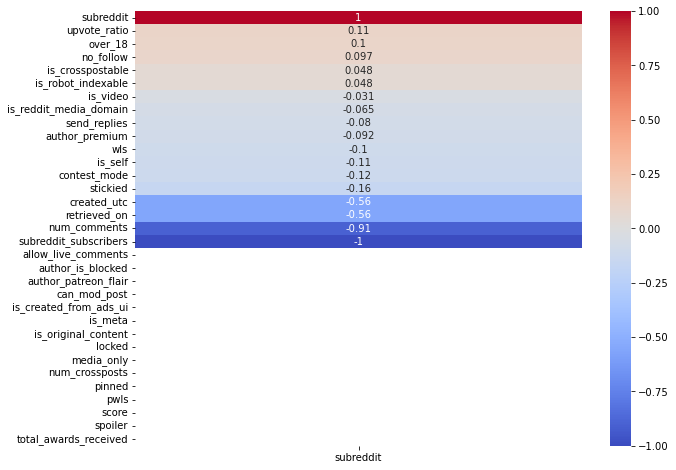

In [494]:
#Let's see the heat map without making dummies to see if we can reduce this further
#Based on Breakfast hour Thursday the 9th
plt.figure(figsize=(10,8))
sns.heatmap(df_nums.corr()[['subreddit']].sort_values(by='subreddit',ascending=False),
            annot = True,
            vmin = -1,
            vmax = 1,
            cmap = 'coolwarm');

Interestingly we see a negative correlation between num of comments and subreddit. Let's examine this more with a box plot:

<AxesSubplot:xlabel='subreddit', ylabel='num_comments'>

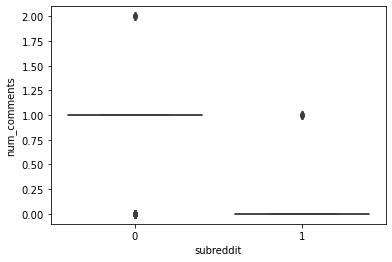

In [495]:
sns.boxplot(x="subreddit", y="num_comments", data=df_chopped)

This indicates that the GenZ subreddit generally has 1 comment per thread and the millenial one has 0 per thread

Let's change all bool types to int types

Before we make these int, we'll make a bool list

In [337]:
df_chopped['allow_live_comments'] = df_chopped['allow_live_comments'].map(lambda x: 1 if x else 0)
df_chopped['author_is_blocked'] = df_chopped['author_is_blocked'].map(lambda x: 1 if x else 0)
df_chopped['author_premium'] = df_chopped['author_premium'].map(lambda x: 1 if x else 0)
df_chopped['can_mod_post'] = df_chopped['can_mod_post'].map(lambda x: 1 if x else 0)
df_chopped['contest_mode'] = df_chopped['contest_mode'].map(lambda x: 1 if x else 0)
df_chopped['is_created_from_ads_ui'] = df_chopped['is_created_from_ads_ui'].map(lambda x: 1 if x else 0)
df_chopped['is_crosspostable'] = df_chopped['is_crosspostable'].map(lambda x: 1 if x else 0)
df_chopped['is_meta'] = df_chopped['is_meta'].map(lambda x: 1 if x else 0)
df_chopped['is_original_content'] = df_chopped['is_original_content'].map(lambda x: 1 if x else 0)
df_chopped['is_reddit_media_domain'] = df_chopped['is_reddit_media_domain'].map(lambda x: 1 if x else 0)
df_chopped['is_robot_indexable'] = df_chopped['is_robot_indexable'].map(lambda x: 1 if x else 0)
df_chopped['is_self'] = df_chopped['is_self'].map(lambda x: 1 if x else 0)
df_chopped['is_video'] = df_chopped['is_video'].map(lambda x: 1 if x else 0)
df_chopped['locked'] = df_chopped['locked'].map(lambda x: 1 if x else 0)
df_chopped['media_only'] = df_chopped['media_only'].map(lambda x: 1 if x else 0)
df_chopped['no_follow'] = df_chopped['no_follow'].map(lambda x: 1 if x else 0)
df_chopped['over_18'] = df_chopped['over_18'].map(lambda x: 1 if x else 0)
df_chopped['pinned'] = df_chopped['pinned'].map(lambda x: 1 if x else 0)
df_chopped['send_replies'] = df_chopped['send_replies'].map(lambda x: 1 if x else 0)
df_chopped['spoiler'] = df_chopped['spoiler'].map(lambda x: 1 if x else 0)
df_chopped['stickied'] = df_chopped['stickied'].map(lambda x: 1 if x else 0)

In [338]:
df_chopped.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1970 entries, 0 to 1999
Data columns (total 59 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   all_awardings                1970 non-null   object 
 1   allow_live_comments          1970 non-null   int64  
 2   author                       1970 non-null   object 
 3   author_flair_richtext        1970 non-null   object 
 4   author_flair_type            1970 non-null   object 
 5   author_fullname              1970 non-null   object 
 6   author_is_blocked            1970 non-null   int64  
 7   author_patreon_flair         1970 non-null   bool   
 8   author_premium               1970 non-null   int64  
 9   awarders                     1970 non-null   object 
 10  can_mod_post                 1970 non-null   int64  
 11  contest_mode                 1970 non-null   int64  
 12  created_utc                  1970 non-null   int64  
 13  domain            

Let's deal with the title and the selftext to see if there is a difference between them in the 2 subreddits

In [339]:
df_chopped['title'].value_counts()

When the plans sounded good but no one’s canceled and you have to *in utter disgust* keep your word                                                                                                                                                                   26
Are You Tired Yet?                                                                                                                                                                                                                                                    20
self sabotage                                                                                                                                                                                                                                                         10
This pic goes hard                                                                                                                                                                                           

We need it to be lower cased

In [340]:
df_chopped['title'] = df_chopped['title'].map(lambda x: x.lower())

In [341]:
df_chopped['title'].value_counts()

when the plans sounded good but no one’s canceled and you have to *in utter disgust* keep your word                                                                                                                                                                   26
the first toy story is amazing                                                                                                                                                                                                                                        20
are you tired yet?                                                                                                                                                                                                                                                    20
twin peaks                                                                                                                                                                                                   

In [393]:
#From lesson 5.05
#word tokenizer
#words = []
#for i in df_chopped['title']:
#    words = words + word_tokenize(i.lower())
#words
#X = df_chopped[['title', 'selftext', 'num_comments']]
X = df_chopped['title']
y = df_chopped['subreddit']

In [394]:
# Check what we need to check in a classification problem.
y.value_counts(normalize=True)

0    0.507614
1    0.492386
Name: subreddit, dtype: float64

In [395]:
# Split the data into the training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.33,
                                                    stratify=y,
                                                    random_state=42)

In [396]:
# Instantiate a CountVectorizer.
cvec = CountVectorizer()

In [397]:
# Instantiate the transformer.
tvec = TfidfVectorizer()

In [398]:
# Fit the vectorizer on our corpus.
cvec.fit(X_train)

CountVectorizer()

In [399]:
# Transform the corpus.
X_train = cvec.transform(X_train)

In [400]:
X_train.shape

(1319, 955)

In [401]:
X_train.todense()

matrix([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [402]:
X_test = cvec.transform(X_test)

In [403]:
train_df = pd.DataFrame(X_train.todense(), columns = cvec.get_feature_names())

train_df.head()

,00,04,09,10,112,13,15,16,16th,18,...,yes,yet,you,younger,youngest,your,yourself,zer,zoomers,zs
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [404]:
train_df['title'] = y_train.values

<AxesSubplot:>

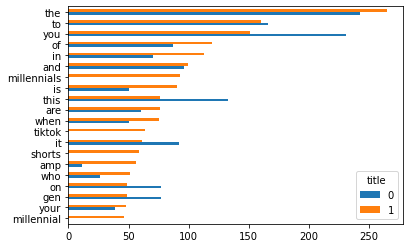

In [405]:
train_df.groupby('title').sum().T.sort_values(1, ascending = True).tail(20).plot.barh()

We see the words milennial(s), tiktok, shorts and amp favor the milennial subreddit and gen favors the GenZ subreddit

In [406]:
#from this url https://stackoverflow.com/questions/33605946/attributeerror-lower-not-found-using-a-pipeline-with-a-countvectorizer-in-scik
def my_tokenizer(X):
    newlist = []
    for alist in X:
        newlist.append(alist[0].split(' '))
    return newlist

In [418]:
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.33,
                                                    stratify=y,
                                                    random_state=42)

In [419]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [420]:
#Taken from 5.06
pipe = Pipeline([
    #('cvec', CountVectorizer(tokenizer=my_tokenizer)),
    ('tvec', TfidfVectorizer()),
    ('nb', MultinomialNB())
])

In [421]:
# Search over the following values of hyperparameters:
# Maximum number of features fit: 200, 300, 400, 500
# Minimum number of documents needed to include token: 2, 3
# Maximum number of documents needed to include token: 90%, 95%
# Check (individual tokens) and also check (individual tokens and 2-grams).
'''
pipe_params = {
    'cvec__max_features': [200, 300, 400, 500],
    'cvec__min_df': [2, 3],
    'cvec__max_df': [.9, .95],
    'cvec__ngram_range': [(1, 1), (1, 2)]
}
'''

"\npipe_params = {\n    'cvec__max_features': [200, 300, 400, 500],\n    'cvec__min_df': [2, 3],\n    'cvec__max_df': [.9, .95],\n    'cvec__ngram_range': [(1, 1), (1, 2)]\n}\n"

In [422]:
# Instantiate GridSearchCV.
'''
gs = GridSearchCV(pipe, # what object are we optimizing?
                  #param_grid = pipe_params, # what parameters values are we searching?
                  cv = 2) # 5-fold cross-validation.
'''

'\ngs = GridSearchCV(pipe, # what object are we optimizing?\n                  #param_grid = pipe_params, # what parameters values are we searching?\n                  cv = 2) # 5-fold cross-validation.\n'

In [423]:
X_train.shape

(1319,)

In [424]:
#gs.fit(X_train, y_train)

In [425]:
pipe.fit(X_train, y_train)

Pipeline(steps=[('tvec', TfidfVectorizer()), ('nb', MultinomialNB())])

In [426]:
print('Train:', pipe.score(X_train, y_train))
print('Test:', pipe.score(X_test, y_test))

Train: 0.9886277482941622
Test: 0.9800307219662059


This indicates that out model is 98% accurate in predicting whether a title is in the 

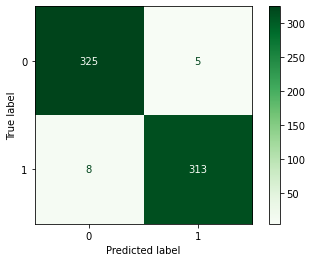

In [427]:
# Confusion matrix
plot_confusion_matrix(pipe, X_test, y_test, cmap='Greens')

It seems that out of 651 testing data, the model only predicted 13 entries incorrectly. Now that we did for title, we will do it for selftext selftext

In [428]:
df_chopped['selftext'] = df_chopped['selftext'].map(lambda x: x.lower())

In [429]:
df_chopped['selftext'].value_counts()

In [430]:
X = df_chopped['selftext']
y = df_chopped['subreddit']

In [431]:
# Check what we need to check in a classification problem.
y.value_counts(normalize=True)

0    0.507614
1    0.492386
Name: subreddit, dtype: float64

In [432]:
# Split the data into the training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.33,
                                                    stratify=y,
                                                    random_state=42)

In [433]:
# Instantiate a CountVectorizer.
cvec = CountVectorizer()

In [434]:
# Instantiate the transformer.
tvec = TfidfVectorizer()

In [435]:
# Fit the vectorizer on our corpus.
cvec.fit(X_train)

CountVectorizer()

In [436]:
# Transform the corpus.
X_train = cvec.transform(X_train)

In [437]:
X_train.shape

(1319, 1608)

In [438]:
X_train.todense()

matrix([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [439]:
X_test = cvec.transform(X_test)

In [440]:
train_df = pd.DataFrame(X_train.todense(), columns = cvec.get_feature_names())

train_df.head()

,000,0025,06,10,100,11,12,13,14,15,...,young,younger,your,yourself,youtu,youtube,yoy,yr,z4mbxaa3xl8,zpomyri0w
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [441]:
train_df['selftext'] = y_train.values

<AxesSubplot:>

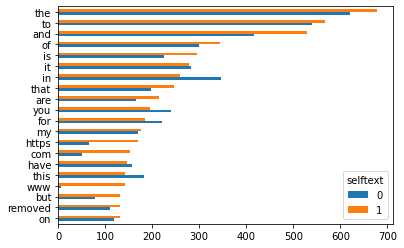

In [442]:
train_df.groupby('selftext').sum().T.sort_values(1, ascending = True).tail(20).plot.barh()

We see that https, com, and www are more common in the millenial subreddit than the GenZ one. This indicates that the millanial subreddit is more likely to put links to things.

In [445]:
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.33,
                                                    stratify=y,
                                                    random_state=42)

In [446]:
#Taken from 5.06
pipe2 = Pipeline([
    #('cvec', CountVectorizer(tokenizer=my_tokenizer)),
    ('tvec', TfidfVectorizer()),
    ('nb', MultinomialNB())
])

In [447]:
pipe2.fit(X_train, y_train)

Pipeline(steps=[('tvec', TfidfVectorizer()), ('nb', MultinomialNB())])

In [448]:
print('Train:', pipe2.score(X_train, y_train))
print('Test:', pipe2.score(X_test, y_test))

Train: 0.624715693707354
Test: 0.5745007680491552


Here the model is only 57% accurate. This isn't great but is still better than our baseline

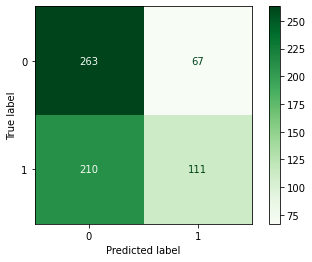

In [449]:
# Confusion matrix
plot_confusion_matrix(pipe2, X_test, y_test, cmap='Greens')

We see that the bulk of the issue comes from the model predicting that some selftext is in the GenZ subreddit when it is really in the Millenial subreddit. This tells me that the model biases towards the GenZ subreddit

Now let's look at logistic regression, testing for other variables. We will use nums list, but remove anything related to posting time, and also will delete the subreddit column as this would corrupt the X values

In [496]:
nums

['allow_live_comments',
 'author_is_blocked',
 'author_patreon_flair',
 'author_premium',
 'can_mod_post',
 'contest_mode',
 'created_utc',
 'is_created_from_ads_ui',
 'is_crosspostable',
 'is_meta',
 'is_original_content',
 'is_reddit_media_domain',
 'is_robot_indexable',
 'is_self',
 'is_video',
 'locked',
 'media_only',
 'no_follow',
 'num_comments',
 'num_crossposts',
 'over_18',
 'pinned',
 'pwls',
 'retrieved_on',
 'score',
 'send_replies',
 'spoiler',
 'stickied',
 'subreddit',
 'subreddit_subscribers',
 'total_awards_received',
 'upvote_ratio',
 'wls']

In [525]:
len(nums)

33

In [538]:
del nums[29]
del nums[28]
del nums[6]
nums

['allow_live_comments',
 'author_is_blocked',
 'author_patreon_flair',
 'author_premium',
 'can_mod_post',
 'contest_mode',
 'is_created_from_ads_ui',
 'is_crosspostable',
 'is_meta',
 'is_original_content',
 'is_reddit_media_domain',
 'is_robot_indexable',
 'is_self',
 'is_video',
 'locked',
 'media_only',
 'no_follow',
 'num_comments',
 'num_crossposts',
 'over_18',
 'pinned',
 'pwls',
 'retrieved_on',
 'score',
 'send_replies',
 'spoiler',
 'stickied',
 'total_awards_received',
 'upvote_ratio',
 'wls']

In [539]:
#Taken from lesson 4.04
# Step 1: Split into training & testing sets
X = df_chopped[['upvote_ratio']]
y = df_chopped['subreddit']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, stratify=y, random_state = 42)

In [540]:
# Step 2: Instantiate our model.
logreg = LogisticRegression()

# Step 3: Fit our model.
logreg.fit(X_train, y_train)

print(f'Log. Reg. Intercept: {logreg.intercept_}')
print(f'Log. Reg. Coef.: {logreg.coef_}')

Log. Reg. Intercept: [-0.12987274]
Log. Reg. Coef.: [[0.09804508]]


In [541]:
#Finding the probablity in X_test
np.round(logreg.predict_proba(X_test), 3)[:100]

array([[0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.508, 0.492],
       [0.5

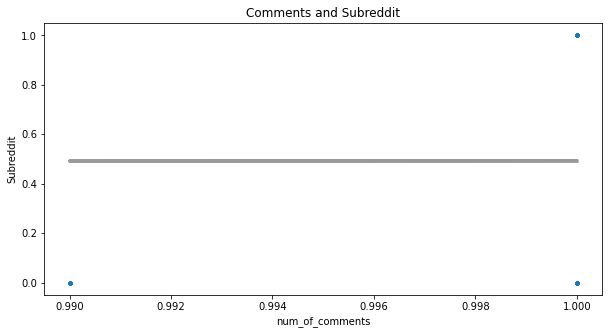

In [542]:
# Visualizing logistic regression probabilities.

plt.figure(figsize = (10, 5))

plt.scatter(X_test, y_test, s = 10);

plt.plot(X_test,
         logreg.predict_proba(X_test)[:,1],
         color = 'grey', alpha = 0.8, lw = 3)

plt.xlabel('num_of_comments')
plt.ylabel('Subreddit')
plt.title('Comments and Subreddit');

In [544]:
#lesson of 4.05
X = df_chopped[nums]
y = df_chopped['subreddit']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, stratify=y, random_state = 42)

In [545]:
# Scale Features
ss = StandardScaler()
X_train_ss = ss.fit_transform(X_train) 
X_test_ss = ss.transform(X_test)

In [546]:
# Instantiate model
log = LogisticRegression()

In [547]:
# Fit model
log.fit(X_train_ss, y_train)

LogisticRegression()

In [549]:
# Generate predictions.
preds = log.predict(X_test_ss)

In [550]:
pred_df = pd.DataFrame({'true_values': y_test, 'pred_probs': log.predict_proba(X_test_ss)[:,1]})
pred_df.head()

,true_values,pred_probs
12,1,0.988369
14,1,0.995877
1397,0,0.231414
991,1,0.999985
222,1,0.973316


C:\Users\matth\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


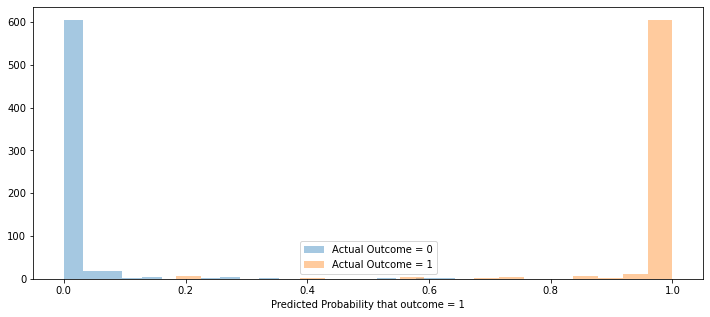

In [551]:
#lesson of 4.05
# Distplot
# Plot distributions of predicted probabilities by actual values
plt.figure(figsize = (12,5))
for group in pred_df.groupby('true_values'):
    sns.distplot(group[1], kde = False, bins = 20, label = f'Actual Outcome = {group[0]}')
plt.xlabel('Predicted Probability that outcome = 1')
plt.legend();

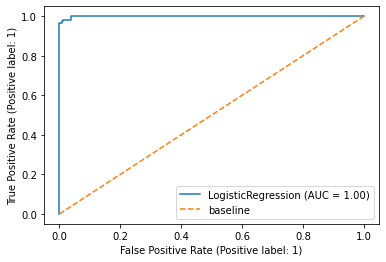

In [554]:
plot_roc_curve(log, X_test_ss, y_test)
plt.plot([0,1], [0,1],
         label = 'baseline',
         linestyle = '--')
plt.legend();

The roc curve is almost a right angle which means that the model is good